In [2]:
from PIL import Image, ImageChops
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
import random

from torchvision.transforms import ToPILImage
from skimage.metrics import structural_similarity as SSIM
from skimage.metrics import mean_squared_error as MSE
to_pil = ToPILImage()


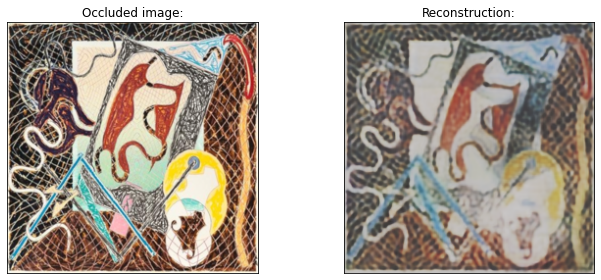

In [7]:
# Visualize original image reconstruction
eval_dir = "../evaluation_output_finetuned"
orig_dataset_dir = "../data/Eval"

# Define which sequence number to visualize
view_seq = '650'

for idx, seq_dir in enumerate(os.listdir(eval_dir)):
    if(seq_dir != view_seq):
        continue
    gt_path = os.path.join(orig_dataset_dir, seq_dir, "gt.png")
    gt_img = np.array(Image.open(gt_path).resize((256, 256)))[:, :, :3]

    gt_rec_path = os.path.join(eval_dir, seq_dir, "gt_reconstruction.png")
    gt_rec_img = np.array(Image.open(gt_rec_path))
   
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4),
                      sharex=True, sharey=True)

    ax = axes.ravel()

    ax[0].imshow(gt_img)
    ax[0].set_title(f'Occluded image:')
    ax[0].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)

    ax[1].imshow(gt_rec_img)
    ax[1].set_title('Reconstruction:')
    ax[1].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)


    plt.tight_layout()
    plt.show()
    




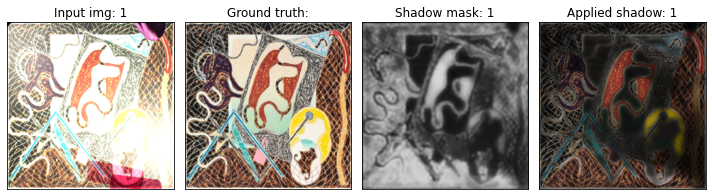

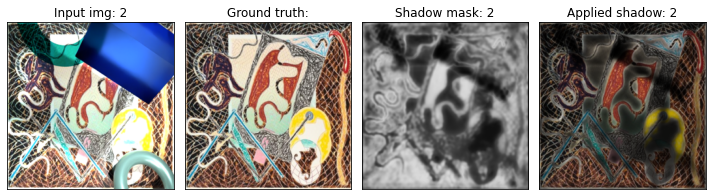

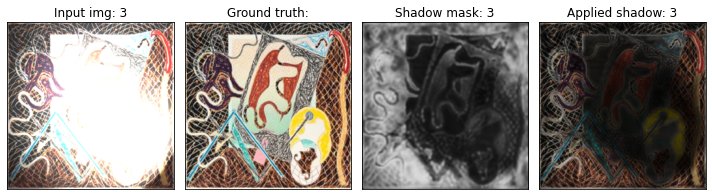

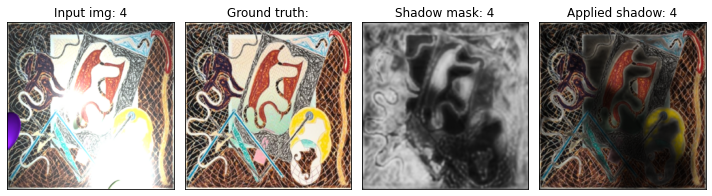

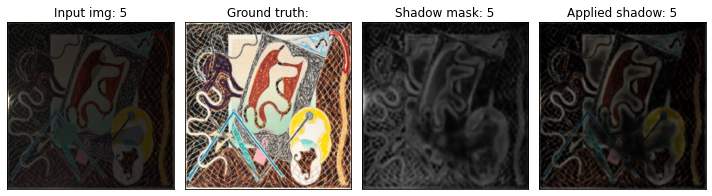

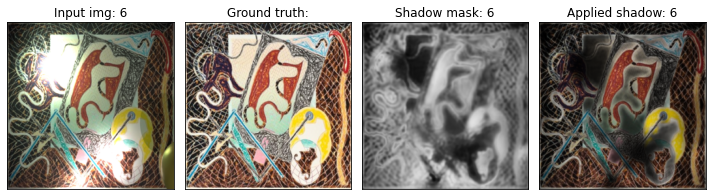

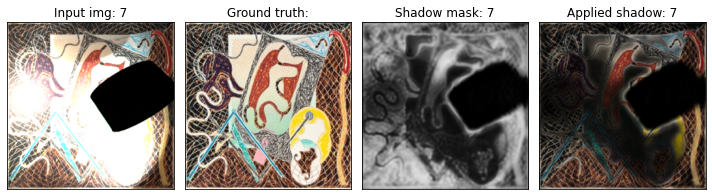

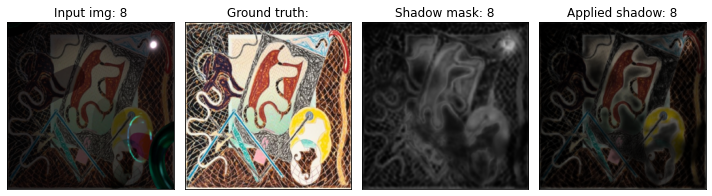

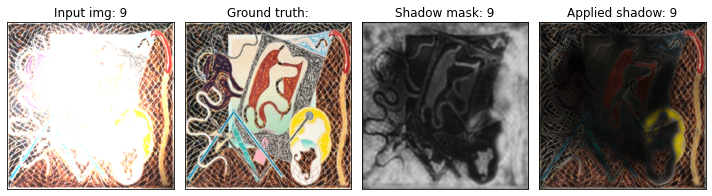

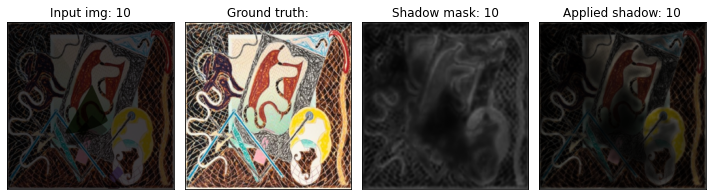

NameError: name 'diff_ssim_sum' is not defined

In [8]:
# Shadow decomposition visualisation

eval_dir = "../evaluation_output_finetuned"
orig_dataset_dir = "../data/Eval"

# Define which sequence number to visualize
view_seq = '650'

for idx, seq_dir in enumerate(os.listdir(eval_dir)):
        
    if(seq_dir != view_seq):
        continue
        
    gt_rec_path = os.path.join(eval_dir, seq_dir, "gt_reconstruction.png")
    gt_rec = np.array(Image.open(gt_rec_path).resize((256, 256)))
    
    gt_path = os.path.join(orig_dataset_dir, seq_dir, "gt.png")
    gt_img = np.array(Image.open(gt_path).resize((256, 256)))[:, :, :3]

    for i in range(10):
        ocl_path = os.path.join(orig_dataset_dir, seq_dir, str(i+1) + ".png")
        ocl_img = np.array(Image.open(ocl_path).resize((256, 256)))[:, :, :3]

        
        shadow_i_path = os.path.join(eval_dir, seq_dir, "shadow_" + str(i+1) + ".png")
        shadow_i = np.array(Image.open(shadow_i_path)) / 255.0
        
        
        gt_rec_multi_add = np.array((gt_img * shadow_i), dtype=np.int32).clip(max = 255)
                

        fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 4),
                          sharex=True, sharey=True)

        ax = axes.ravel()

        ax[0].imshow(ocl_img)
        ax[0].set_title(f'Input img: {str(i+1)}')
        ax[0].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)

        ax[1].imshow(gt_img)
        ax[1].set_title('Ground truth:')
        ax[1].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)
        
        
        ax[2].imshow(shadow_i)
        ax[2].set_title(f'Shadow mask: {str(i+1)}')
        ax[2].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)
        
        
        ax[3].imshow(gt_rec_multi_add)
        ax[3].set_title(f'Applied shadow: {str(i+1)}')
        ax[3].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)

        plt.tight_layout()
        plt.show()




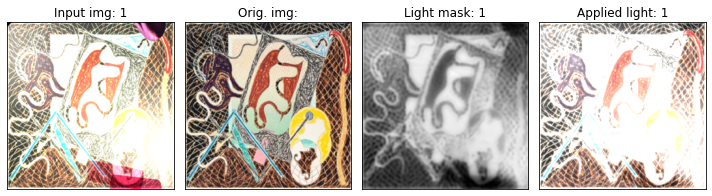

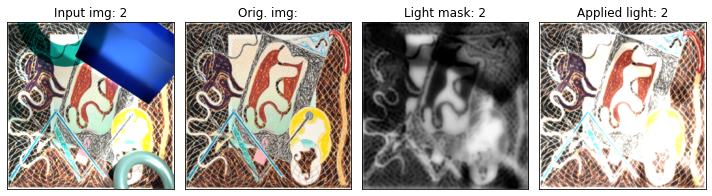

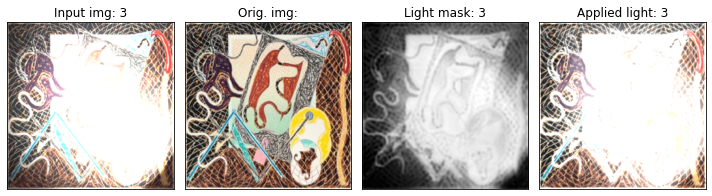

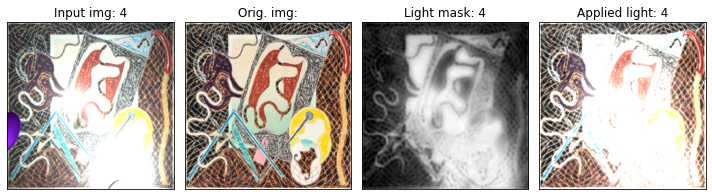

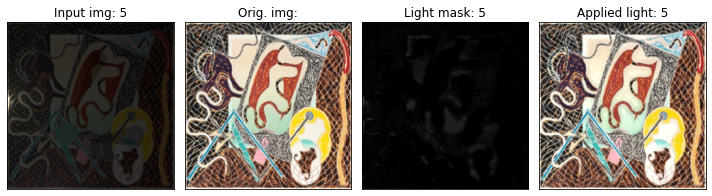

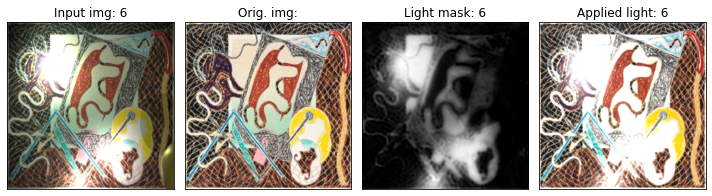

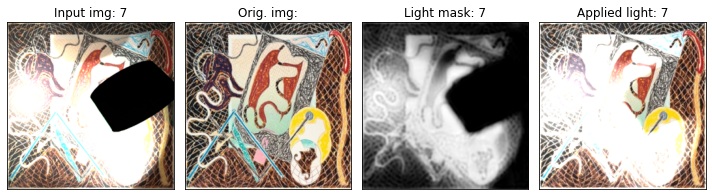

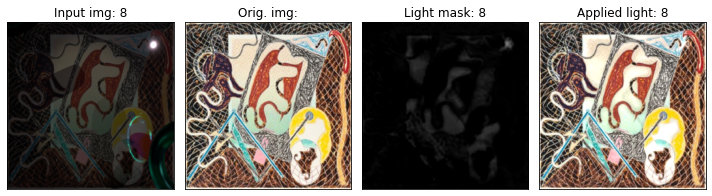

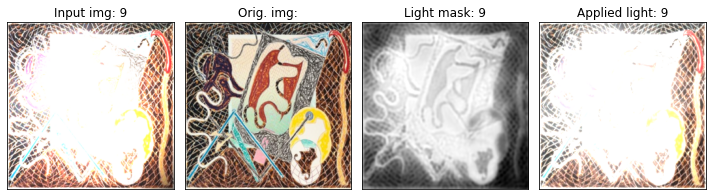

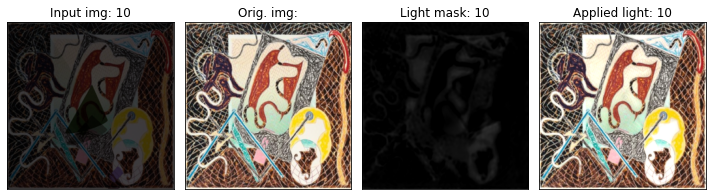

In [10]:
# Light decomposition visualisation

eval_dir = "../evaluation_output_finetuned"
orig_dataset_dir = "../data/Eval"

# Define which sequence number to visualize
view_seq = '650'

for idx, seq_dir in enumerate(os.listdir(eval_dir)):
        
    if(seq_dir != view_seq):
        continue
        
    gt_rec_path = os.path.join(eval_dir, seq_dir, "gt_reconstruction.png")
    gt_rec = np.array(Image.open(gt_rec_path).resize((256, 256)))
    
    gt_path = os.path.join(orig_dataset_dir, seq_dir, "gt.png")
    gt_img = np.array(Image.open(gt_path).resize((256, 256)))[:, :, :3]

    for i in range(10):
        ocl_path = os.path.join(orig_dataset_dir, seq_dir, str(i+1) + ".png")
        ocl_img = np.array(Image.open(ocl_path).resize((256, 256)))[:, :, :3]

        
        shadow_i_path = os.path.join(eval_dir, seq_dir, "shadow_" + str(i+1) + ".png")
        shadow_i = np.array(Image.open(shadow_i_path)) / 255.0
        
        light_i_path = os.path.join(eval_dir, seq_dir, "light_" + str(i+1) + ".png")
        light_i = np.array(Image.open(light_i_path), dtype = np.int32)
        
        gt_rec_add = np.array((gt_img + light_i), dtype=np.int32).clip(max = 255)
        gt_rec_multi_add = np.array((gt_img * shadow_i + light_i), dtype=np.int32).clip(max = 255)
                

        fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 4),
                          sharex=True, sharey=True)

        ax = axes.ravel()

        ax[0].imshow(ocl_img)
        ax[0].set_title(f'Input img: {str(i+1)}')
        ax[0].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)

        ax[1].imshow(gt_img)
        ax[1].set_title(f'Orig. img:')
        ax[1].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)
        
        
        ax[2].imshow(light_i)
        ax[2].set_title(f'Light mask: {str(i+1)}')
        ax[2].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)
        
        
        ax[3].imshow(gt_rec_add)
        ax[3].set_title(f'Applied light: {str(i+1)}')
        ax[3].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)

        plt.tight_layout()
        plt.show()



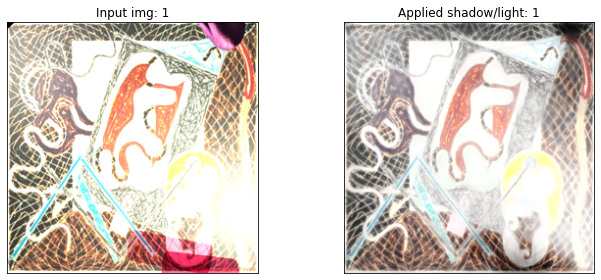

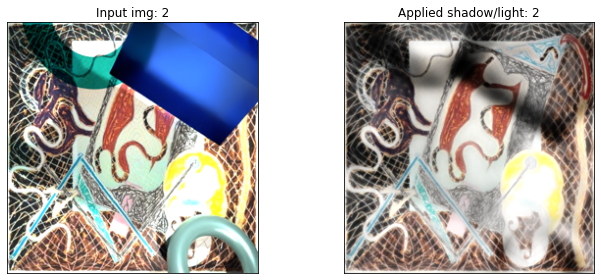

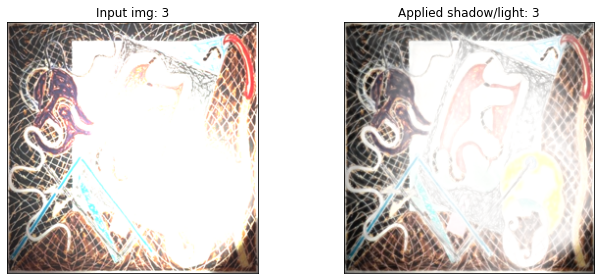

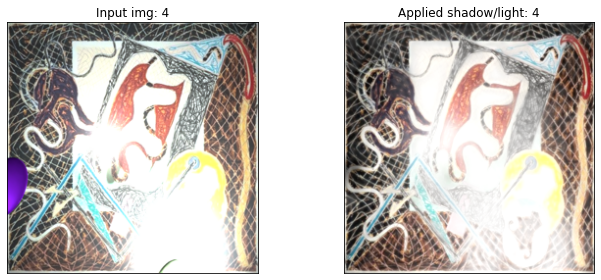

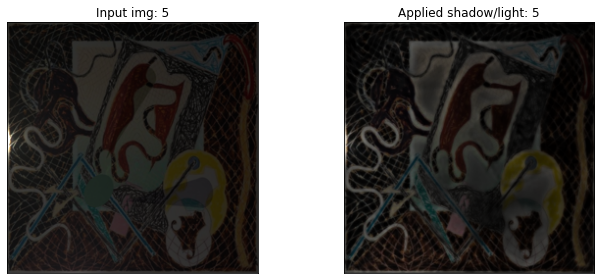

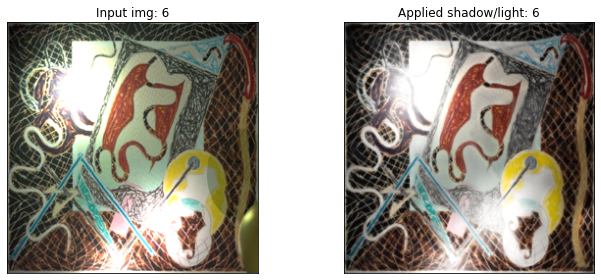

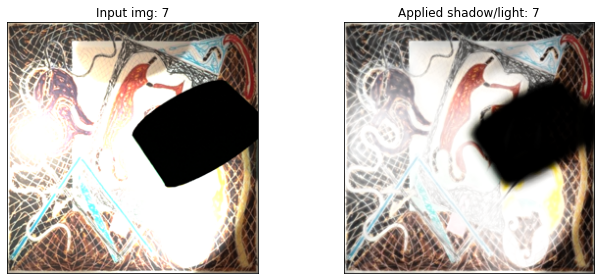

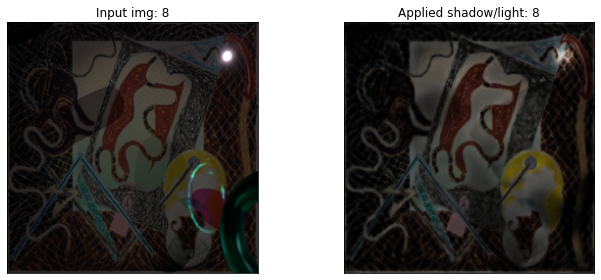

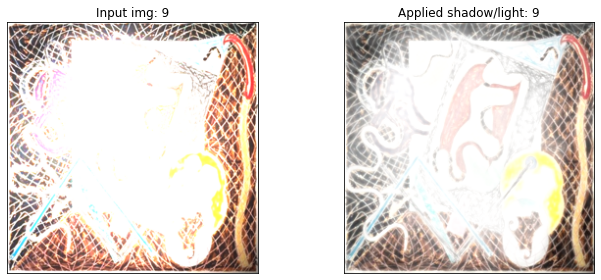

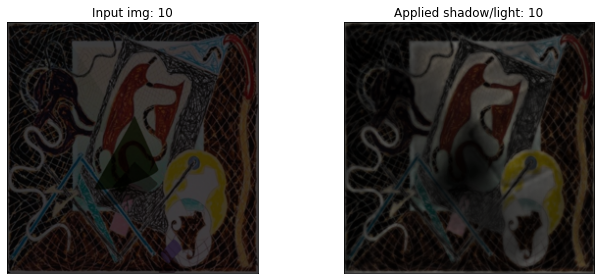

In [11]:
# Shadow and Light decomposition

eval_dir = "../evaluation_output_finetuned"
orig_dataset_dir = "../data/Eval"

# Define which sequence number to visualize
view_seq = '650'

for idx, seq_dir in enumerate(os.listdir(eval_dir)):
        
    if(seq_dir != view_seq):
        continue
        
    gt_rec_path = os.path.join(eval_dir, seq_dir, "gt_reconstruction.png")
    gt_rec = np.array(Image.open(gt_rec_path).resize((256, 256)))
    
    gt_path = os.path.join(orig_dataset_dir, seq_dir, "gt.png")
    gt_img = np.array(Image.open(gt_path).resize((256, 256)))[:, :, :3]

    for i in range(10):
        ocl_path = os.path.join(orig_dataset_dir, seq_dir, str(i+1) + ".png")
        ocl_img = np.array(Image.open(ocl_path).resize((256, 256)))[:, :, :3]

        
        shadow_i_path = os.path.join(eval_dir, seq_dir, "shadow_" + str(i+1) + ".png")
        shadow_i = np.array(Image.open(shadow_i_path)) / 255.0
        
        light_i_path = os.path.join(eval_dir, seq_dir, "light_" + str(i+1) + ".png")
        light_i = np.array(Image.open(light_i_path), dtype = np.int32)
        
        gt_rec_add = np.array((gt_img + light_i), dtype=np.int32).clip(max = 255)
        gt_rec_multi_add = np.array((gt_img * shadow_i + light_i), dtype=np.int32).clip(max = 255)
                

        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4),
                          sharex=True, sharey=True)

        ax = axes.ravel()

        ax[0].imshow(ocl_img)
        ax[0].set_title(f'Input img: {str(i+1)}')
        ax[0].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)

        ax[1].imshow(gt_rec_multi_add)
        ax[1].set_title(f'Applied shadow/light: {str(i+1)}')
        ax[1].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)

        plt.tight_layout()
        plt.show()



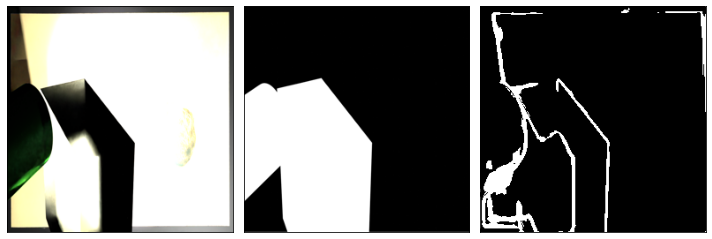

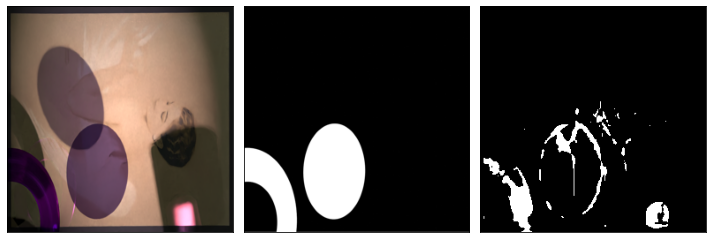

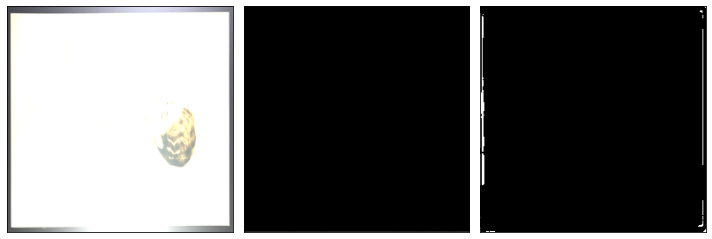

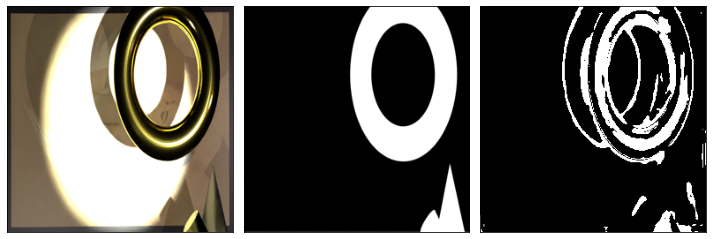

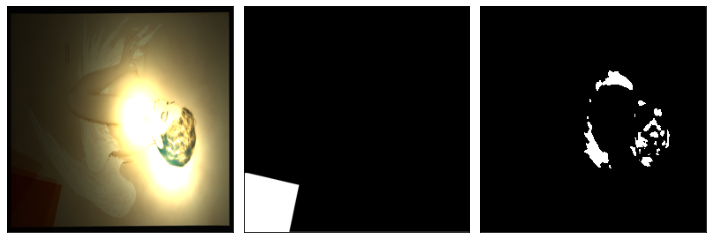

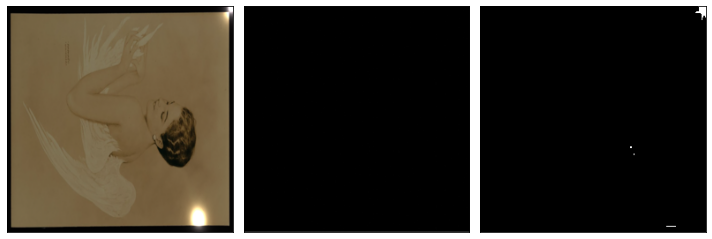

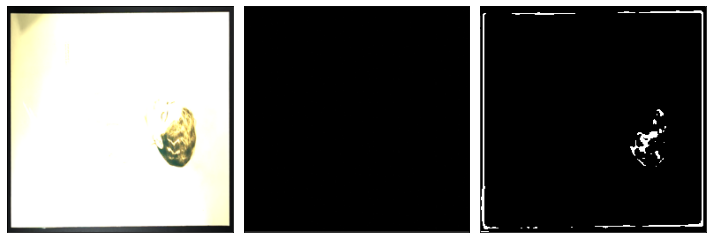

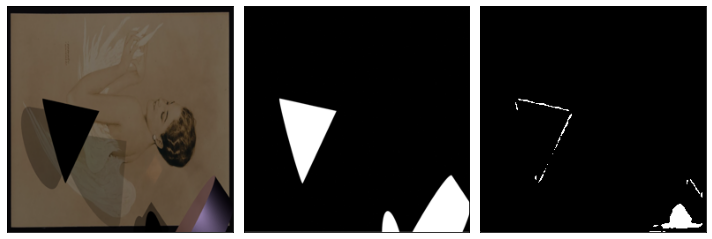

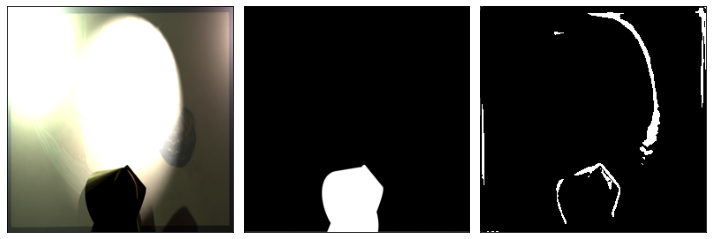

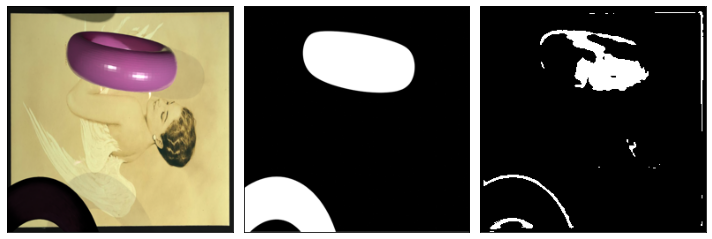

In [40]:
# Occlusion mask visualization
eval_dir = "../evaluation_output_finetuned"
orig_dataset_dir = "../data/Eval"

view_seq = '6828'

for idx, seq_dir in enumerate(os.listdir(eval_dir)):
    if(seq_dir != view_seq):
        continue
    gt_rec_path = os.path.join(eval_dir, seq_dir, "gt_reconstruction.png")
    gt_rec = np.array(Image.open(gt_rec_path).resize((256, 256)))
    
    gt_path = os.path.join(orig_dataset_dir, seq_dir, "gt.png")
    gt_img = np.array(Image.open(gt_path).resize((256, 256)))[:, :, :3]

    for i in range(10):
        
        ocl_path = os.path.join(orig_dataset_dir, seq_dir, str(i+1) + ".png")
        ocl_img = np.array(Image.open(ocl_path).resize((256, 256)))[:, :, :3]

        
        orig_occ_binary_path = os.path.join(orig_dataset_dir, seq_dir, str(i+1) + "-m.png")
        orig_occ_binary_img = np.array(Image.open(orig_occ_binary_path).resize((256, 256)))[:, :, :3]
        
        
        occ_path = os.path.join(eval_dir, seq_dir, "occ_" + str(i+1) + ".png")
        occ_img = np.array(Image.open(occ_path).resize((256, 256)))[:, :, :3]
        occ_img = np.array(Image.fromarray(occ_img).convert("L"))
        occ_img = np.where(
            occ_img > 1,
            np.full(occ_img.shape, 1),
            np.zeros(occ_img.shape)
        )
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 4),
                          sharex=True, sharey=True)

        ax = axes.ravel()

        ax[0].imshow(ocl_img)
        #ax[0].set_title(f'Occlusion gt: {str(i+1)}')
        ax[0].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)

        ax[1].imshow(orig_occ_binary_img)
        #ax[1].set_title(f'Occlusion gt binary mask: {str(i+1)}')
        ax[1].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)
        
        ax[2].imshow(occ_img, cmap = "gray")
        #ax[2].set_title(f'Occlusion mask: {str(i+1)}')
        ax[2].tick_params(left = False, right = False , labelleft = False , labelbottom = False, bottom = False)

        plt.tight_layout()
        plt.show()
